# A cautionary tale in advection

In [1]:
using LinearAlgebra, Plots, Printf, SparseArrays
include("./amath586.jl")
using .amath586

In [2]:
h = 0.01
m = convert(Int64,1/h)-1;
k = 0.1
T = 10.
a = 1.0;

## Periodic problem with forward Euler

For $a > 0$

$$ \begin{cases} u_t + a u_{x} = 0,\\
u(x,0) = \eta(x),\\
u(0,t) = u(1,t). \end{cases} $$

In [3]:
# Initial condition
η = x -> exp.(-20*(x .-1/2).^2)
# Initial condition chosen so that u(x,t) = sin(2*pi*(x - t)), if a = 1
# η = x -> sin.(2*pi*x)
# u = (x,t) -> sin.(2*pi*(x.-t))

#1 (generic function with 1 method)

Build MOL matrix

$$ U'(t) = A U(t).$$

In [4]:
A = Tridiagonal(fill(-1.0,m),fill(0.0,m+1),fill(1.0,m)); #increase dim by 1
A = sparse(A) # Need to convert A₀ to a new data type to allow new entries
A[1,end] = -1
A[end,1]  = 1
A *= -a/(2h)
A |> Array;

In [5]:
k = 2*h^2
B = I + k*A;

┌ Info: Saved animation to 
│   fn = /Users/thomastrogdon/Dropbox (uwamath)/Teaching/586/amath-586-2022/notebooks/advection_periodic_FE.gif
└ @ Plots /Users/thomastrogdon/.julia/packages/Plots/YAlrZ/src/animation.jl:114


Plots.AnimatedGif("/Users/thomastrogdon/Dropbox (uwamath)/Teaching/586/amath-586-2022/notebooks/advection_periodic_FE.gif")
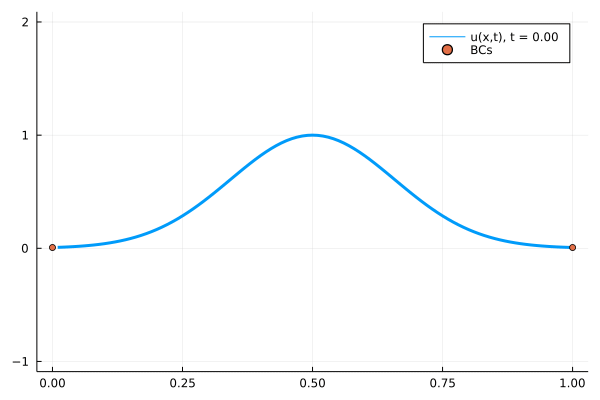

In [6]:
anim = Animation()
n = convert(Int64,ceil(T/k))
x = h:h:1 # include right end point
U = η(x)
t = 0.0
plot(x, U, xaxis = [0,1], yaxis = [-1,2],lw=3,label = @sprintf("u(x,t), t = %1.2f",t))
plot!([0,1],[U[end],U[end]], label = "BCs", seriestype = :scatter)
frame(anim)

fr = 50 #frames/unit time
tb = convert(Int64,ceil(n/(fr*T)))
for i = 2:n+1
    t += k
    U = B*U
    if mod(i-1,tb) ≈ 0.0
        IJulia.clear_output(true)
        plot(x, U, xaxis = [0,1], yaxis = [-1,2],lw=3,label = @sprintf("u(x,t), t = %1.2f",t))
        plot!([0,1],[U[end],U[end]], label = "BCs", seriestype = :scatter) |> IJulia.display
        frame(anim)
    end
end
IJulia.clear_output(true)
gif(anim,"advection_periodic_FE.gif")

## Periodic problem with leapfrog

For $a > 0$

$$ \begin{cases} u_t + a u_{x} = 0,\\
u(x,0) = \eta(x),\\
u(0,t) = u(1,t). \end{cases} $$

which gives

$$ U^{n+1} = U^{n-1} + 2 k S U^n.$$

We compute $U^1$ with forward Euler and begin the iteration.

┌ Info: Saved animation to 
│   fn = /Users/thomastrogdon/Dropbox (uwamath)/Teaching/586/amath-586-2022/notebooks/advection_periodic_leap.gif
└ @ Plots /Users/thomastrogdon/.julia/packages/Plots/YAlrZ/src/animation.jl:114


Plots.AnimatedGif("/Users/thomastrogdon/Dropbox (uwamath)/Teaching/586/amath-586-2022/notebooks/advection_periodic_leap.gif")
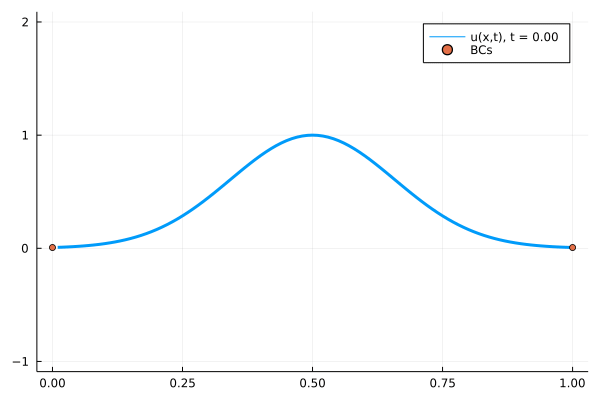

In [7]:
anim = Animation()
n = convert(Int64,ceil(T/k))
x = h:h:1 # include right end point
U = η(x)
t = 0.0
plot(x, U, xaxis = [0,1], yaxis = [-1,2],lw=3,label = @sprintf("u(x,t), t = %1.2f",t))
plot!([0,1],[U[end],U[end]], label = "BCs", seriestype = :scatter)
frame(anim)

fr = 50 #frames/unit time
tb = convert(Int64,ceil(n/(fr*T)))
t += k
Uold = U
U = B*U ## first step with forward Euler

for i = 3:n+1
    t += k
    Utemp = U
    U = Uold + 2*k*A*U
    Uold = Utemp
    if mod(i-1,tb) ≈ 0.0
        IJulia.clear_output(true)
        plot(x, U, xaxis = [0,1], yaxis = [-1,2],lw=3,label = @sprintf("u(x,t), t = %1.2f",t))
        plot!([0,1],[U[end],U[end]], label = "BCs", seriestype = :scatter) |> IJulia.display
        frame(anim)
    end
end
IJulia.clear_output(true)
gif(anim,"advection_periodic_leap.gif")

We are solving $U' = A U$ and all the eigenvalues of $A$ are purely imaginary:

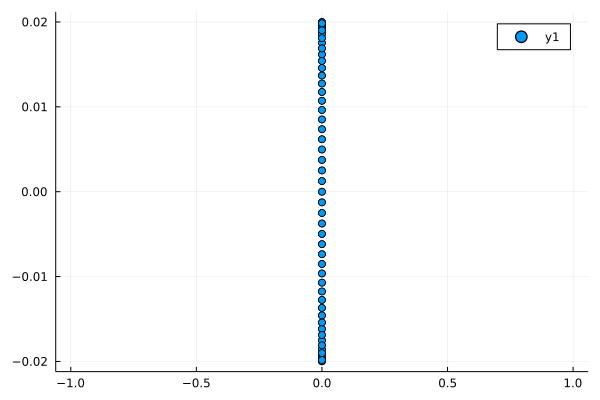

In [8]:
λ = eigvals(k*A |> Array)
plot(real(λ),imag(λ), seriestype = :scatter, xaxis = [-1,1])

In [9]:
a*k/h # bound on the modulus of the eigenvalues

0.02

Recall the stability region for leapfrog.  So, as long as the eigenvalues of $A$ do not exceed 1 in absolute value, the method will be stable --- $|ak/h| \leq 1$.

Method is consistent
Method is zero-stable


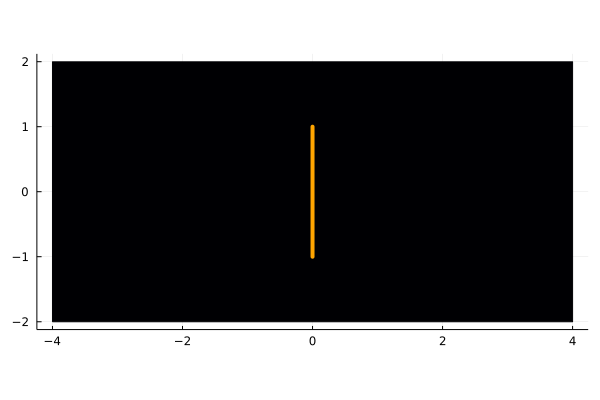

In [10]:
# Leapfrog
α = [1,0,-1]
β = [0,2,0]
convergence_stability(α,β)

At the stability boundary

In [39]:
h = 0.01
m = convert(Int64,1/h)-1;
k = h/(a*1.0001)
T = 10.
a = 1.0;
η = x -> exp.(-20*(x .-1/2).^2)
A = Tridiagonal(fill(-1.0,m),fill(0.0,m+1),fill(1.0,m)); #increase dim by 1
A = sparse(A) # Need to convert A₀ to a new data type to allow new entries
A[1,end] = -1
A[end,1]  = 1
A *= -a/(2h);

In [40]:
B = I + k*A;

In [41]:
a*k/h # bound on the modulus of the eigenvalues

0.9999000099990002

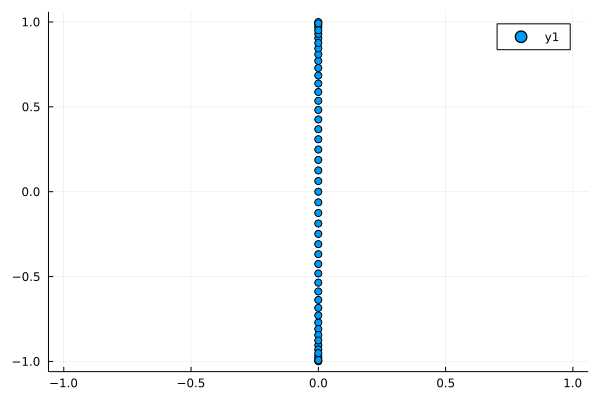

In [42]:
λ = eigvals(k*A |> Array)
plot(real(λ),imag(λ), seriestype = :scatter, xaxis = [-1,1])

┌ Info: Saved animation to 
│   fn = /Users/thomastrogdon/Dropbox (uwamath)/Teaching/586/amath-586-2022/notebooks/advection_periodic_leap_stable.gif
└ @ Plots /Users/thomastrogdon/.julia/packages/Plots/YAlrZ/src/animation.jl:114


Plots.AnimatedGif("/Users/thomastrogdon/Dropbox (uwamath)/Teaching/586/amath-586-2022/notebooks/advection_periodic_leap_stable.gif")
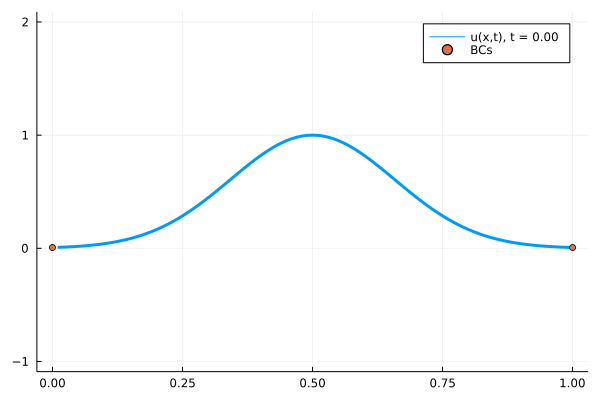

In [38]:
anim = Animation()
n = convert(Int64,ceil(T/k))
x = h:h:1 # include right end point
U = η(x)
t = 0.0
plot(x, U, xaxis = [0,1], yaxis = [-1,2],lw=3,label = @sprintf("u(x,t), t = %1.2f",t))
plot!([0,1],[U[end],U[end]], label = "BCs", seriestype = :scatter)
frame(anim)

fr = 50 #frames/unit time
tb = convert(Int64,ceil(n/(fr*T)))
Uold = U
U = B*U

for i = 3:n+1
    t += k
    Utemp = U
    U = Uold + 2*k*A*U
    Uold = Utemp
    if mod(i-1,tb) ≈ 0.0
        IJulia.clear_output(true)
        plot(x, U, xaxis = [0,1], yaxis = [-1,2],lw=3,label = @sprintf("u(x,t), t = %1.2f",t))
        plot!([0,1],[U[end],U[end]], label = "BCs", seriestype = :scatter) |> IJulia.display
        frame(anim)
    end
end
IJulia.clear_output(true)
gif(anim,"advection_periodic_leap_stable.gif")

The method is stable, but not accurate!

Just beyond the stability boundary:

In [ ]:
h = 0.01
m = convert(Int64,1/h)-1;
k = h/a+0.00001
T = 2.
a = 1.0;
η = x -> exp.(-20*(x .-1/2).^2)
A = Tridiagonal(fill(-1.0,m),fill(0.0,m+1),fill(1.0,m)); #increase dim by 1
A = sparse(A) # Need to convert A₀ to a new data type to allow new entries
A[1,end] = -1
A[end,1]  = 1
A *= -a/(2h);

In [ ]:
anim = Animation()
n = convert(Int64,ceil(T/k))
x = h:h:1 # include right end point
U = η(x)
t = 0.0
plot(x, U, xaxis = [0,1], yaxis = [-1,2],lw=3,label = @sprintf("u(x,t), t = %1.2f",t))
plot!([0,1],[U[end],U[end]], label = "BCs", seriestype = :scatter)
frame(anim)

fr = 50 #frames/unit time
tb = convert(Int64,ceil(n/(fr*T)))
t += k
Uold = U
U = B*U

for i = 3:n+1
    t += k
    Utemp = U
    U = Uold + 2*k*A*U
    Uold = Utemp
    if mod(i-1,tb) ≈ 0.0
        IJulia.clear_output(true)
        plot(x, U, xaxis = [0,1], yaxis = [-1,2],lw=3,label = @sprintf("u(x,t), t = %1.2f",t))
        plot!([0,1],[U[end],U[end]], label = "BCs", seriestype = :scatter) |> IJulia.display
        frame(anim)
    end
end
IJulia.clear_output(true)
gif(anim,"advection_periodic_leap_unstable.gif")

## Dirichlet BC with leapfrog

For $a > 0$

$$ \begin{cases} u_t + a u_{x} = 0,\\
u(x,0) = \eta(x),\\
u(0,t) = g_0(t). \end{cases} $$

which gives

$$ U^{n+1} = U^{n-1} + 2 k A U^n.$$

We compute $U^1$ with forward Euler and begin the iteration.  But now the last row of $A$ has to be modified.

In [ ]:
# Initial and boundary conditions
η = x -> exp.(-20*(x .-1/2).^2)
g0(t) = sin(4*t)

In [ ]:
h = 0.01
m = convert(Int64,1/h)-1;
k = h^2/4
T = 10.
a = 1.0;

In [ ]:
A = Tridiagonal(fill(-1.0,m),fill(0.0,m+1),fill(1.0,m));
A = sparse(A)
A[end,end-2:end] = [1,-4,3];
A *= -a/(2h);

First try forward Euler

In [ ]:
anim = Animation()
n = convert(Int64,ceil(T/k))
x = h:h:1 # include right end point
U = η(x)
t = 0.0
plot(x, U, xaxis = [0,1], yaxis = [-1,2],lw=3,label = @sprintf("u(x,t), t = %1.2f",t))
# If solution is known
# plot!(x, u(x,t), xaxis = [0,1], yaxis = [-1,2],lw=1,label = @sprintf("u(x,t), t = %1.2f",t))
plot!([0,1],[g0(t),U[end]], label = "BCs", seriestype = :scatter)
frame(anim)

fr = 50 #frames/unit time
tb = convert(Int64,ceil(n/(fr*T)))
for i = 2:n+1
    t += k
    
    U = U + k*(A*U)
    U[1] += a*k/(2h)*g0(t-k)
    if mod(i-1,tb) ≈ 0.0
        IJulia.clear_output(true)
        plot(x, U, xaxis = [0,1], yaxis = [-1,2],lw=3,label = @sprintf("u(x,t), t = %1.2f",t))
        # If solution is known
        # plot!(x, u(x,t), xaxis = [0,1], yaxis = [-1,2],lw=1,label = @sprintf("u(x,t), t = %1.2f",t))
        plot!([0,1],[g0(t),U[end]], label = "BCs", seriestype = :scatter) |> IJulia.display
        frame(anim)
    end
end
IJulia.clear_output(true)
gif(anim,"advection_dirichlet_FE.gif")


Then go to leapfrog:

In [ ]:
h = 0.01
m = convert(Int64,1/h)-1;
k = h^2/4
T = 5.
a = 1.0;

In [ ]:
A = Tridiagonal(fill(-1.0,m),fill(0.0,m+1),fill(1.0,m)); #increase dim by 1
A = sparse(A)
A[end,end-2:end] = [1,-4,3];
A *= -a/(2h);

In [ ]:
anim = Animation()
n = convert(Int64,ceil(T/k))
x = h:h:1 # include right end point
U = η(x)
t = 0.0
plot(x, U, xaxis = [0,1], yaxis = [-1,2],lw=3,label = @sprintf("u(x,t), t = %1.2f",t))
plot!([0,1],[g0(t),U[end]], label = "BCs", seriestype = :scatter)
frame(anim)

fr = 50 #frames/unit time
tb = convert(Int64,ceil(n/(fr*T)))
t += k
Uold = U
U = U + k*(A*U)  # start off with forward Euler
U[1] += a*k/(2h)*g0(t-k) 

for i = 3:n+1
    t += k
    Utemp = U
    U = Uold + 2*k*A*U
    U[1] += a*k/(h)*g0(t-k)
    Uold = Utemp
    if mod(i-1,tb) ≈ 0.0
        IJulia.clear_output(true)
        plot(x, U, xaxis = [0,1], yaxis = [-1,2],lw=3,label = @sprintf("u(x,t), t = %1.2f",t))
        plot!([0,1],[g0(t),U[end]], label = "BCs", seriestype = :scatter) |> IJulia.display
        frame(anim)
    end
end
IJulia.clear_output(true)
gif(anim,"advection_dirichlet_leap.gif")


In [ ]:
λ = eigvals(k*A |> Array)
plot(real(λ),imag(λ), seriestype = :scatter, xaxis = [-1,1])

In [ ]:
λ = eigvals(k*A |> Array)
plot(real(λ),imag(λ), seriestype = :scatter, xaxis = [-.001,.001])